In [6]:
# !pip install tensorflow
# !pip install keras
# !pip install opencv-python 
# !pip install tqdm
# !pip install matplotlib
# !pip install tensorflow_addons
# !pip install tensorflow_datasets
# !pip install git+https://github.com/tensorflow/examples.git

In [7]:

import tensorflow as tf
# Common
import os
import keras
import numpy as np
from glob import glob
from tqdm import tqdm
import tensorflow as tf
from random import random
import cv2
from tensorflow_examples.models.pix2pix import pix2pix
import time
from tensorflow.keras.callbacks import Callback
# Data
import tensorflow.image as tfi
import matplotlib.pyplot as plt
from tensorflow.keras.utils import load_img
from tensorflow.keras.utils import img_to_array


In [8]:
real_images = 'Thatnewnewdatawoo/img'
anime_images = 'Thatnewernewnewdatawoo'

def load_images(path):
    images = []
    for filename in os.listdir(path):
        img = cv2.imread(os.path.join(path,filename))
        if img is not None:
            img = cv2.resize(img, (256,256)) # resize the image again to the desired size
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img = (img.astype('float32') - 127.5)/127.5# normalize pixel values
            images.append(img)
    images = np.array(images)
    return images

good_images = load_images(real_images)

bad_images = load_images(anime_images)

good_images[0]

array([[[1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ],
        ...,
        [1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ]],

       [[1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ],
        ...,
        [1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ]],

       [[1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ],
        ...,
        [1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ]],

       ...,

       [[0.9607843 , 0.94509804, 0.9529412 ],
        [0.9607843 , 0.94509804, 0.9529412 ],
        [0.9529412 , 0

In [9]:
sample_sharp = next(iter(good_images))
sample_blured = next(iter(bad_images))

In [10]:
def make_generator_model():
    model = tf.keras.Sequential()
    # Encoder
    model.add(tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=(128, 128, 3)))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.MaxPooling2D((2, 2)))

    model.add(tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.MaxPooling2D((2, 2)))

    model.add(tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.MaxPooling2D((2, 2)))

    model.add(tf.keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.MaxPooling2D((2, 2)))

    # Decoder
    model.add(tf.keras.layers.Conv2DTranspose(256, (3, 3), strides=(2, 2), padding='same', activation='relu'))
    model.add(tf.keras.layers.BatchNormalization())

    model.add(tf.keras.layers.Conv2DTranspose(128, (3, 3), strides=(2, 2), padding='same', activation='relu'))
    model.add(tf.keras.layers.BatchNormalization())

    model.add(tf.keras.layers.Conv2DTranspose(64, (3, 3), strides=(2, 2), padding='same', activation='relu'))
    model.add(tf.keras.layers.BatchNormalization())

    model.add(tf.keras.layers.Conv2DTranspose(32, (3, 3), strides=(2, 2), padding='same', activation='relu'))
    model.add(tf.keras.layers.BatchNormalization())

    model.add(tf.keras.layers.Conv2DTranspose(3, (3, 3), strides=(1, 1), padding='same', activation='tanh'))
    return model

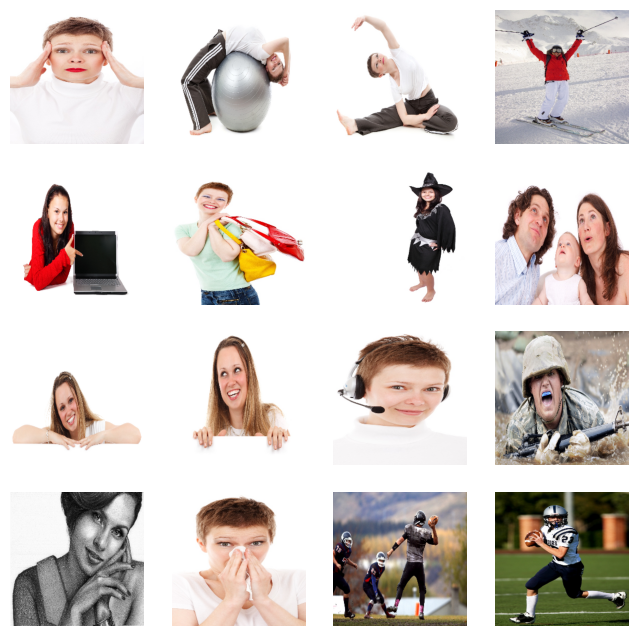

In [11]:
fig,axs = plt.subplots(nrows=4,ncols=4,figsize=(8,8))
for i in range(16):
    ax = axs[i//4,i%4]
    sample = good_images[i]
    sample = (((sample * 127.5) + 127.5)).astype(np.uint8)
    ax.imshow((sample))
    ax.axis('off')
plt.show()

In [12]:
# fig,axs = plt.subplots(nrows=4,ncols=4,figsize=(8,8))
# for i in range(16):
#     ax = axs[i//4,i%4]
#     sample = bad_images[i]
#     sample = (((sample * 127.5) + 127.5)).astype(np.uint8)
#     ax.imshow(sample)
#     ax.axis('off')
# plt.show()

In [13]:
OUTPUT_CHANNELS = 3

generator_g = pix2pix.unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')
generator_f = pix2pix.unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')

discriminator_x = pix2pix.discriminator(norm_type='instancenorm', target=False)
discriminator_y = pix2pix.discriminator(norm_type='instancenorm', target=False)

In [14]:
def generate_images(model, test_input):
  prediction = model(test_input)

  plt.figure(figsize=(12, 12))

  display_list = [test_input[0], prediction[0]]
  title = ['Input Image', 'Predicted Image']

  for i in range(2):
    plt.subplot(1, 2, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

In [20]:
LAMBDA = 10
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)
def discriminator_loss(real, generated):
  real_loss = loss_obj(tf.ones_like(real), real)

  generated_loss = loss_obj(tf.zeros_like(generated), generated)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss * 0.5

def generator_loss(generated):
    return loss_obj(tf.ones_like(generated), generated)
def calc_cycle_loss(real_image, cycled_image):
    loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))

    return LAMBDA * loss1

def identity_loss(real_image, same_image):
    loss = tf.reduce_mean(tf.abs(real_image - same_image))
    return LAMBDA * 0.5 * loss

def truncate_datasets(dataset_x, dataset_y):
    min_size = min(len(dataset_x), len(dataset_y))
    return dataset_x[:min_size], dataset_y[:min_size]

class LinearDecayLR(Callback):
    def __init__(self, initial_lr, final_lr, decay_start_epoch, total_epochs, optimizers):
        super(LinearDecayLR, self).__init__()
        self.initial_lr = initial_lr
        self.final_lr = final_lr
        self.decay_start_epoch = decay_start_epoch
        self.total_epochs = total_epochs
        self.optimizers = optimizers

    def on_epoch_begin(self, epoch, logs=None):
        if epoch >= self.decay_start_epoch:
            # Calculate the linear decay factor
            decay_epochs = self.total_epochs - self.decay_start_epoch
            lr_decay_rate = (self.initial_lr - self.final_lr) / decay_epochs
            new_lr = max(self.initial_lr - lr_decay_rate * (epoch - self.decay_start_epoch), self.final_lr)
        else:
            new_lr = self.initial_lr

        for optimizer in self.optimizers:
            tf.keras.backend.set_value(optimizer.lr, new_lr)

        # Output the current learning rate for each optimizer
        print(f"Epoch {epoch + 1}/{self.total_epochs}")
        for i, optimizer in enumerate(self.optimizers):
            current_lr = tf.keras.backend.get_value(optimizer.lr)
            print(f"Optimizer {i + 1} learning rate: {current_lr:.8f}")


generator_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)


In [16]:
checkpoint_path = "./checkpoints/train/2"

ckpt = tf.train.Checkpoint(generator_g=generator_g,
                           generator_f=generator_f,
                           discriminator_x=discriminator_x,
                           discriminator_y=discriminator_y,
                           generator_g_optimizer=generator_g_optimizer,
                           generator_f_optimizer=generator_f_optimizer,
                           discriminator_x_optimizer=discriminator_x_optimizer,
                           discriminator_y_optimizer=discriminator_y_optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

# if a checkpoint exists, restore the latest checkpoint.
if ckpt_manager.latest_checkpoint:
  ckpt.restore(ckpt_manager.latest_checkpoint)
  print ('Latest checkpoint restored!!')

Latest checkpoint restored!!


In [17]:

@tf.function
def train_step(real_x, real_y):
  # persistent is set to True because the tape is used more than
  # once to calculate the gradients.
  with tf.GradientTape(persistent=True) as tape:
    # Generator G translates X -> Y
    # Generator F translates Y -> X.

    fake_y = generator_g(real_x, training=True)
    cycled_x = generator_f(fake_y, training=True)

    fake_x = generator_f(real_y, training=True)
    cycled_y = generator_g(fake_x, training=True)

    # same_x and same_y are used for identity loss.
    same_x = generator_f(real_x, training=True)
    same_y = generator_g(real_y, training=True)

    disc_real_x = discriminator_x(real_x, training=True)
    disc_real_y = discriminator_y(real_y, training=True)

    disc_fake_x = discriminator_x(fake_x, training=True)
    disc_fake_y = discriminator_y(fake_y, training=True)

    # calculate the loss
    gen_g_loss = generator_loss(disc_fake_y)
    gen_f_loss = generator_loss(disc_fake_x)

    total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)

    # Total generator loss = adversarial loss + cycle loss
    total_gen_g_loss = gen_g_loss + total_cycle_loss + identity_loss(real_y, same_y)
    total_gen_f_loss = gen_f_loss + total_cycle_loss + identity_loss(real_x, same_x)

    disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
    disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)

  # Calculate the gradients for generator and discriminator
  generator_g_gradients = tape.gradient(total_gen_g_loss, 
                                        generator_g.trainable_variables)
  generator_f_gradients = tape.gradient(total_gen_f_loss, 
                                        generator_f.trainable_variables)

  discriminator_x_gradients = tape.gradient(disc_x_loss, 
                                            discriminator_x.trainable_variables)
  discriminator_y_gradients = tape.gradient(disc_y_loss, 
                                            discriminator_y.trainable_variables)

  # Apply the gradients to the optimizer
  generator_g_optimizer.apply_gradients(zip(generator_g_gradients, 
                                            generator_g.trainable_variables))

  generator_f_optimizer.apply_gradients(zip(generator_f_gradients, 
                                            generator_f.trainable_variables))

  discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients,
                                                discriminator_x.trainable_variables))

  discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients,
                                                discriminator_y.trainable_variables))

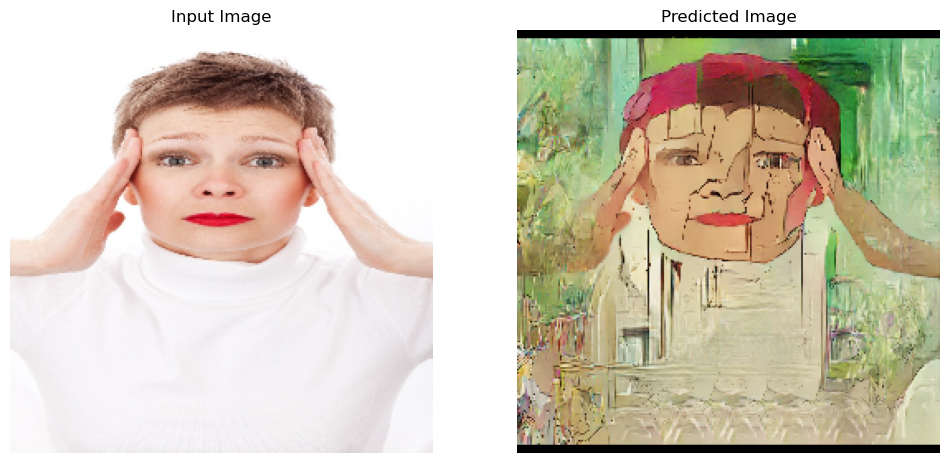

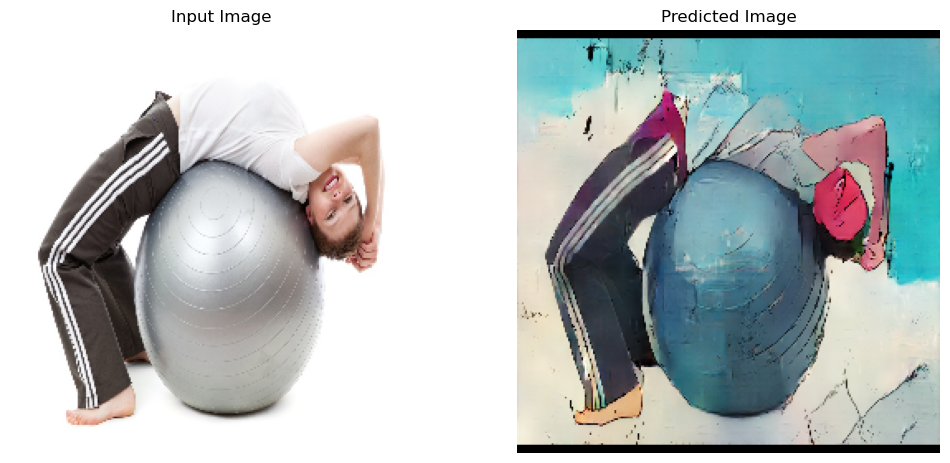

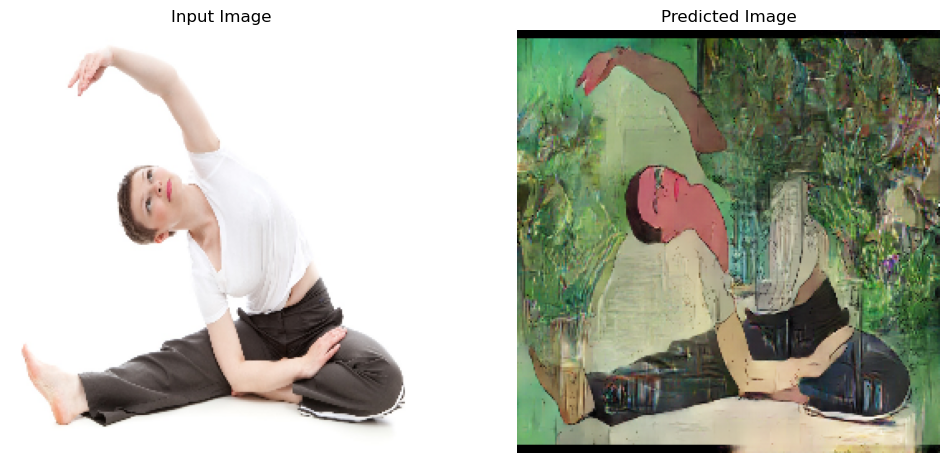

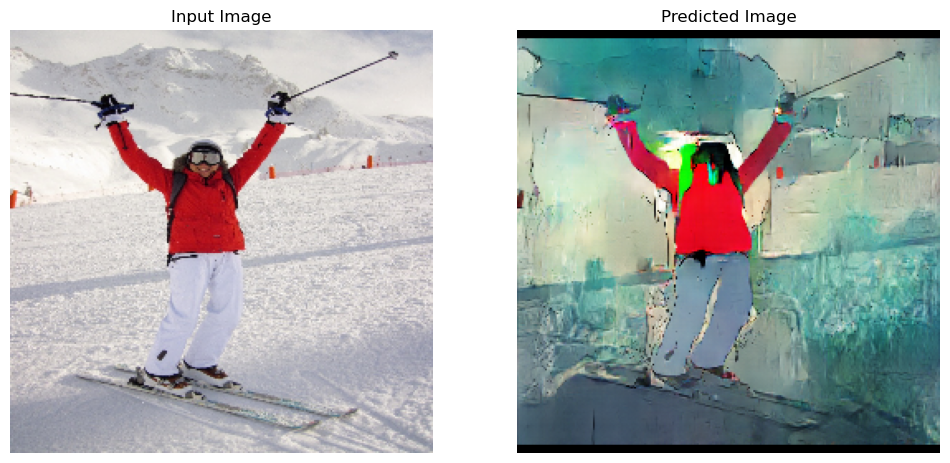

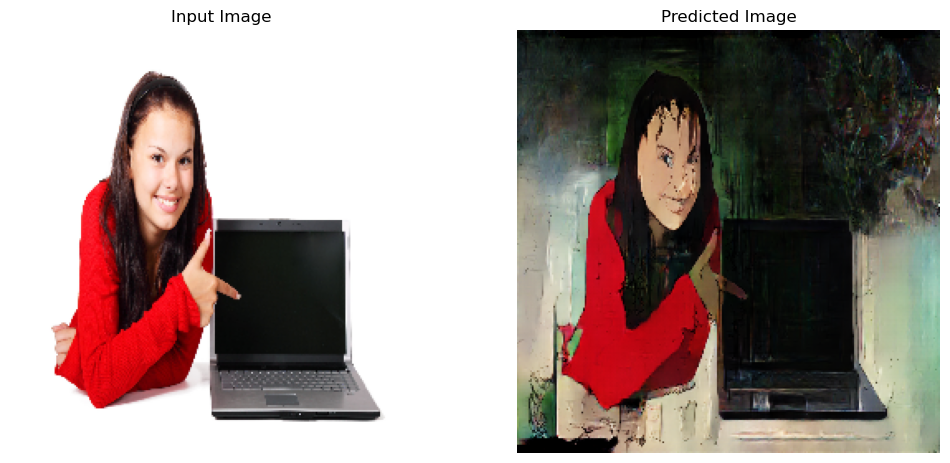

...

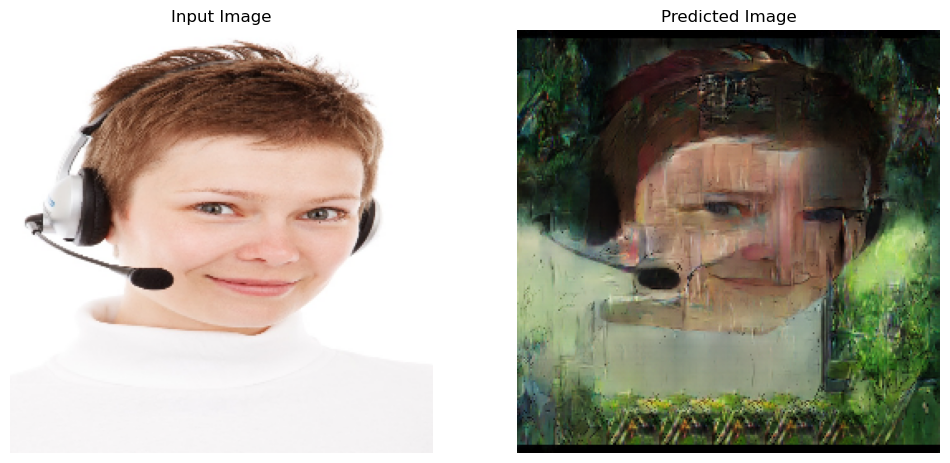

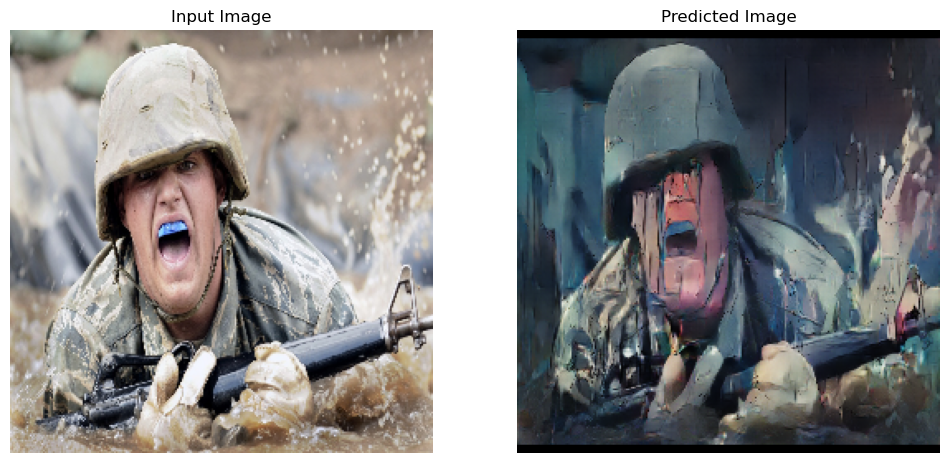

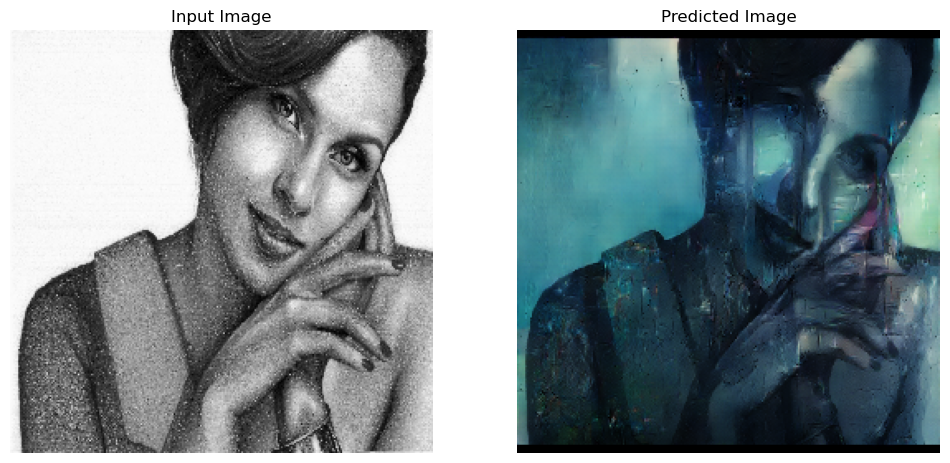

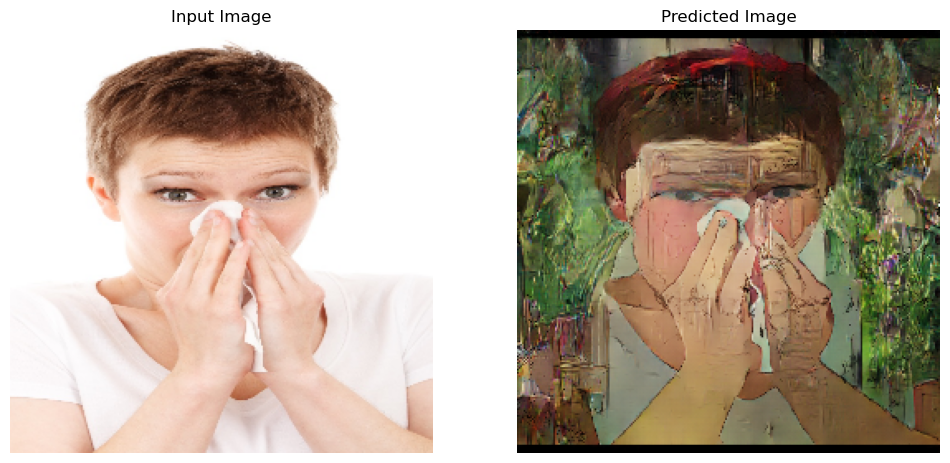

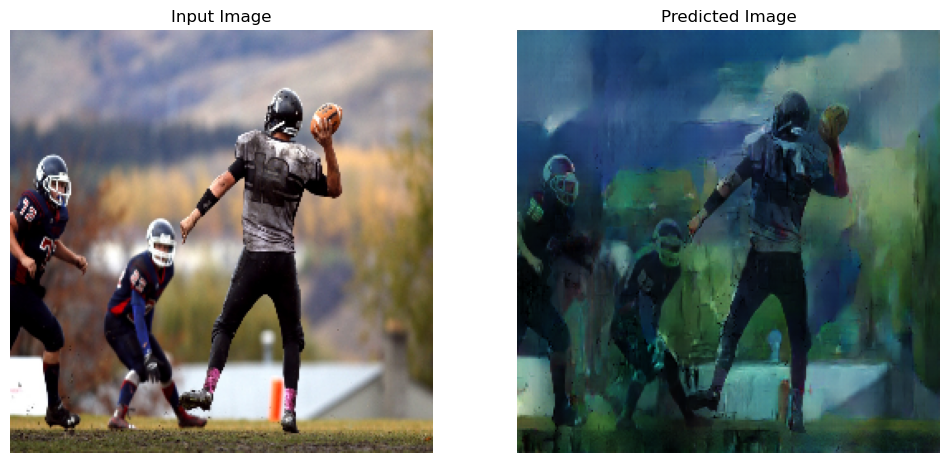

Saving checkpoint for epoch 209 at ./checkpoints/train/2\ckpt-208
Time taken for epoch 209 is 654.9027523994446 sec

Epoch 210/262
Optimizer 1 learning rate: 0.00008211
Optimizer 2 learning rate: 0.00008211
Optimizer 3 learning rate: 0.00008211
Optimizer 4 learning rate: 0.00008211


  0%|          | 0/2000 [00:00<?, ?it/s]

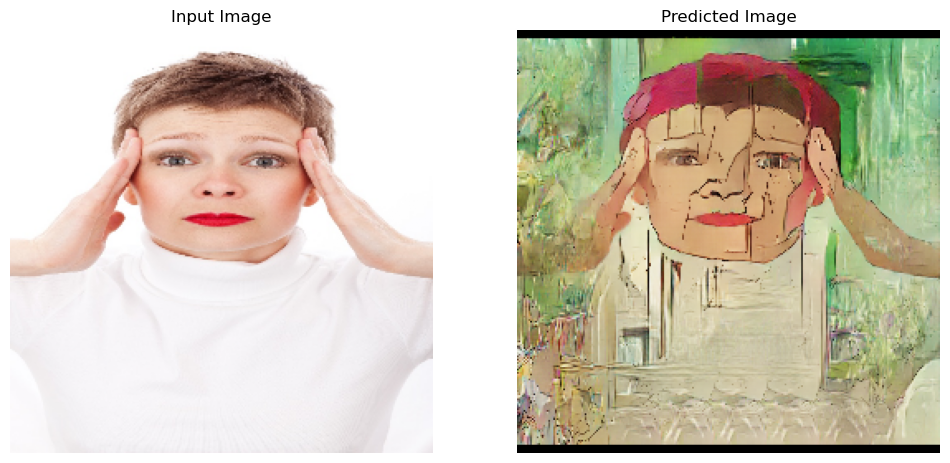

  5%|▌         | 100/2000 [00:32<10:15,  3.09it/s]

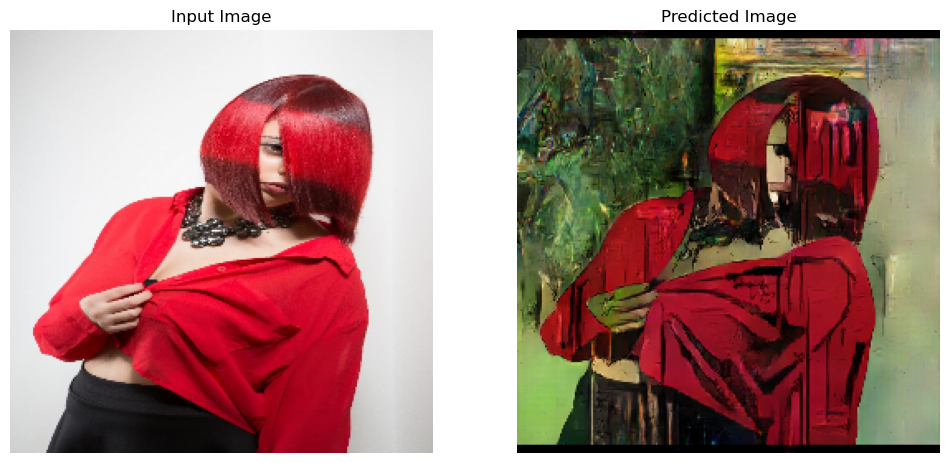

 10%|█         | 200/2000 [01:05<09:41,  3.09it/s]

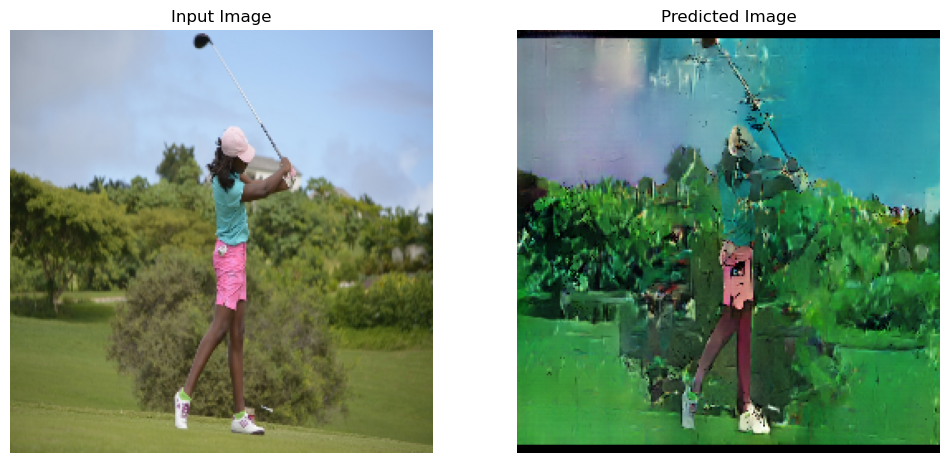

 15%|█▌        | 300/2000 [01:38<08:57,  3.16it/s]

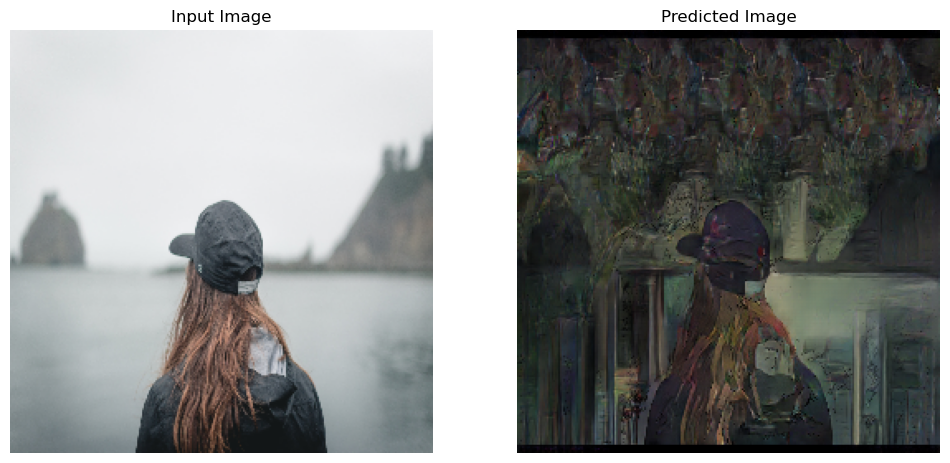

 20%|██        | 400/2000 [02:10<08:29,  3.14it/s]

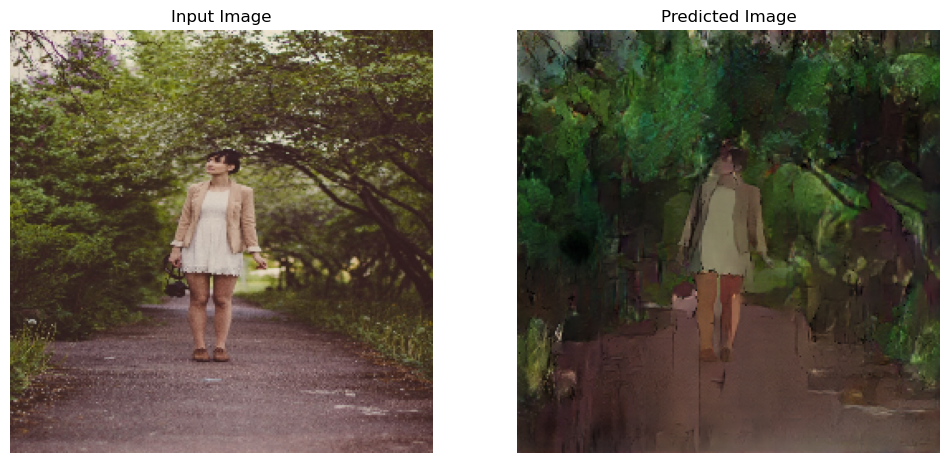

 25%|██▌       | 500/2000 [02:42<08:00,  3.12it/s]

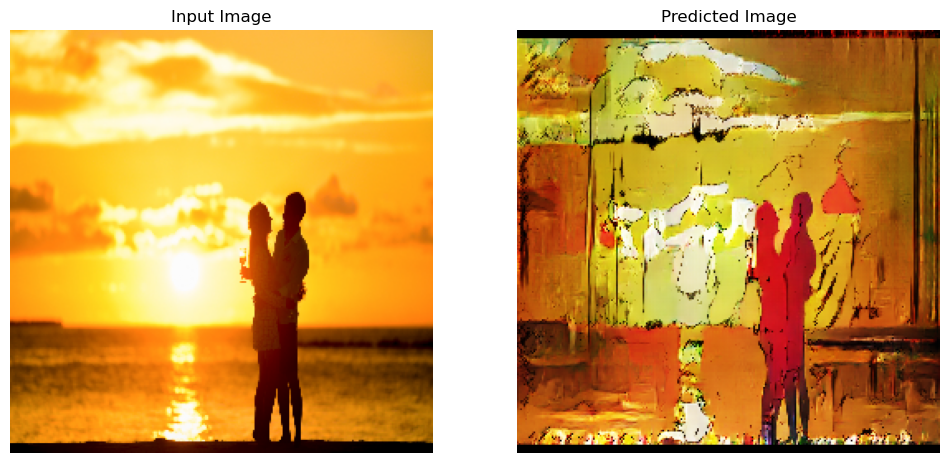

 26%|██▌       | 521/2000 [02:49<08:02,  3.07it/s]

In [23]:
from IPython.display import clear_output
# Initial learning rate, final learning rate, and epochs settings
EPOCHS = 262
initial_lr = 2e-4
final_lr = 2e-6
decay_start_epoch = 131
total_epochs = EPOCHS  # Assuming EPOCHS is defined as 200

# Initialize the LinearDecayLR scheduler with all optimizers
optimizers = [
    generator_g_optimizer,
    generator_f_optimizer,
    discriminator_x_optimizer,
    discriminator_y_optimizer
]
linear_decay_lr = LinearDecayLR(
    initial_lr=initial_lr,
    final_lr=final_lr,
    decay_start_epoch=decay_start_epoch,
    total_epochs=total_epochs,
    optimizers=optimizers
)
good_images, bad_images = truncate_datasets(good_images, bad_images)
for epoch in range(131,EPOCHS):

  start = time.time()
  BATCH_SIZE=1 #According to all papers batch size must be 1 still defined it to maintain 4 dims when passed to model
  n = 0
  linear_decay_lr.on_epoch_begin(epoch)
  
  for i in tqdm(range(0, len(good_images), BATCH_SIZE)):
    image_x = bad_images[i:i+BATCH_SIZE]
    image_y = good_images[i:i+BATCH_SIZE]

    train_step(image_x, image_y)
    if i %100 ==0:
      generate_images(generator_f, image_y)
  clear_output(wait=True)
  # Using a consistent image so that the progress of the model
  # is clearly visible.
  for x in range(len(good_images[:15])):
    image_x = good_images[x:x+BATCH_SIZE]
    generate_images(generator_f, image_x)

  if (epoch + 1) % 1 == 0:
    ckpt_save_path = ckpt_manager.save()
    print ('Saving checkpoint for epoch {} at {}'.format(epoch+1,
                                                          ckpt_save_path))

  print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,
                                                      time.time()-start))

In [ ]:
for x in range(len(bad_images[:15])):
  image_x = good_images[x:x+BATCH_SIZE]
  generate_images(generator_g, image_x)